### The AQACF and Fire Alarm projects are supported via NASA's Earth Science Technology Office (ESTO) from the Advanced Information Systems Technology (AIST) Program

# Air Quality Analytics Collaborative Framework (AQACF) API Demonstration

This notebook highlits some of the analytics and visualization capabilities of AQACF with eight use cases:
- 2021 Dixie Fire
- 2023 Alberta Canada Wildfires
- 2018 Carr Fire
- Los Angeles ports backlog Fall 2021
- Fireworks during 4th of July 2022 in Los Angeles county
- Predict What We Breathe PM2.5 Predictions
- Air Pollution in the Yellow Sea
- 2022 Fire Season in Southeast Asia

## Libraries and Functions

The following libraries are needed to support accessing FireAlarm API. The functions called in this notebook are in the `firealarm_modules` folder.

### Libraries

In [3]:
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import xml.etree.ElementTree as xmlet
import requests
import pandas as pd
from datetime import datetime, timedelta
from shapely.geometry import box
import numpy as np
from IPython.display import Image
from owslib.util import Authentication
from owslib.wms import WebMapService
from PIL import Image as I
from PIL import ImageDraw, ImageFont

import firealarm_modules.plotting as plotting
import firealarm_modules.firealarm_processing as firealarm_processing

## AQACF DATA Inventory

The base url, https://ideas-digitaltwin.jpl.nasa.gov/nexus, is the entry to access FireAlarm API. In the following code snipet, it is used in conjunction with list endpoint to get a list of datasets.

In [894]:
BASE_URL = 'https://ideas-digitaltwin.jpl.nasa.gov'
NEXUS_URL = f'{BASE_URL}/nexus'
INSITU_URL = f'{BASE_URL}/insitu/1.0'

In [211]:
r = requests.get(f'{NEXUS_URL}/list', verify=False).json()
inv_df = pd.DataFrame(r)[['title', 'iso_start', 'iso_end']].dropna(how='all')
inv_df.sort_values('title')

,title,iso_start,iso_end
0,GLDAS_CLSM10_3H_2_1_global_Qs_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
1,GLDAS_CLSM10_3H_2_1_global_Qsb_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
2,GLDAS_NOAH10_3H_2_1_global_Qs_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
3,GLDAS_NOAH10_3H_2_1_global_Qsb_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
4,GLDAS_VIC10_3H_2_1_global_Qs_acc,2018-10-01T00:00:00+0000,2022-03-01T21:00:00+0000
...,...,...,...
241,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D...,1970-01-01T00:00:00+0000,1970-12-01T00:00:00+0000
242,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D8,2017-03-01T12:00:00+0000,2018-12-31T12:00:00+0000
243,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D...,1970-01-01T00:00:00+0000,1970-12-01T00:00:00+0000
244,wustl-0.1degx0.1deg-daily-ca-SpeciesConc_SO2_D9,2017-03-01T12:00:00+0000,2018-12-31T12:00:00+0000


In [901]:
r = requests.get(f'{INSITU_URL}/sub_collection_statistics')

# Dixie Fire

The 2021 California wildfire season was one of the worst on record with 2,569,386 million acres burned. The 2021 CA wildfire season produces hundreds of fires including the Dixie fire that, at nearly a million acres burned, is the largest single source fire in state history. 
It's estimated that California wildfires emitted 75 million metric tons of carbon dioxide in just three months (June - August 2021).

75 million metric tons of carbon dioxide is equal to:
- 16,310,993 passenger cars driven for a year (Greenhouse Gas - GHG)
- 188,489,840,317 miles driven by an average passenger vehicle (GHG)
- 8,439,293,350 gallons of gasoline consumed (Carbon Dioxide Emissions – CO2)
- 82,896,993 pounds of coal burned (CO2)
- 173,640,855 barrels of oil consumed (CO2)

Relevant Articles:
- https://www.nytimes.com/2021/09/21/climate/wildfire-emissions-climate-change.html 
- https://www.theguardian.com/us-news/2021/dec/25/what-the-numbers-tells-us-about-a-catastrophic-year-of-wildfires 

### Area of Interest

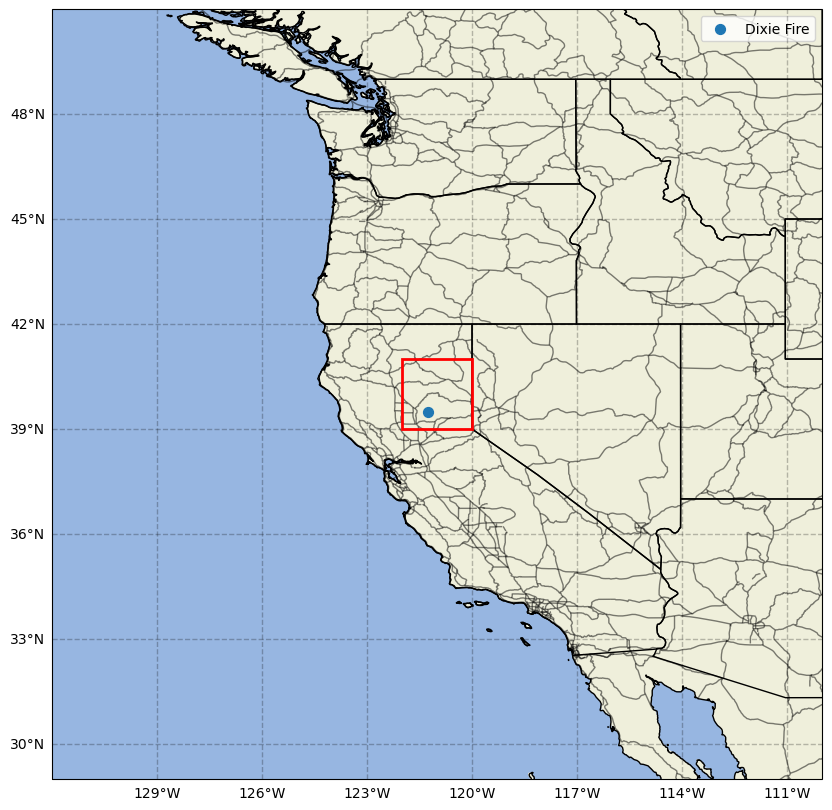

In [842]:
wildfires_bb = {'min_lon': -122, 'max_lon': -120, 'min_lat': 39, 'max_lat': 41}
dixie_start = datetime(2021,7,1)
dixie_end = datetime(2021,10,1)

plotting.map_box(wildfires_bb, [(39.4908, -121.2508, 'Dixie Fire')], padding=10)

### Dixie Fire Aerosol Index Visualization via GIBS

In [569]:
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers = ['BlueMarble_NextGeneration',
          'OMPS_Aerosol_Index',
          'Reference_Features',
          'Reference_Labels']
font = ImageFont.truetype('Roboto-Bold.ttf', size=18)
color = 'rgb(255,255,255)'
frames = []

sdate = datetime(2021, 7, 13)
edate = datetime(2021, 8, 20)
dates = pd.date_range(sdate,edate-timedelta(days=1),freq='d')

print(f'Obtaining {len(dates)} days of imagery from GIBS...')

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(-128,30,-110,50), # Bounds
                     size=(500, 500),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 12)
    draw.text((x, y), f'Suomi NPP OMPS Aerosol Index  - {datatime}', fill='rgb(0,0,0)', font=font)
    frames.append(image)

Obtaining 38 days of imagery from GIBS...


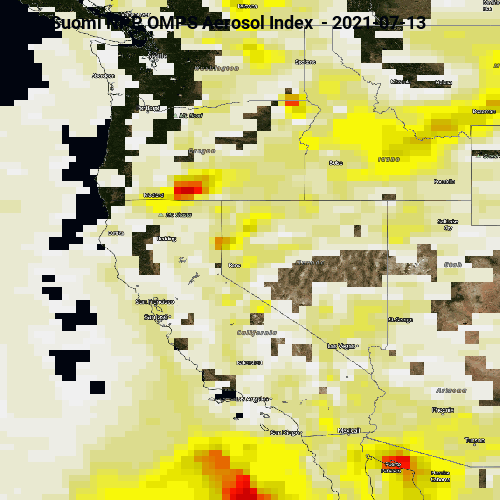

In [571]:
frames[0].save('OMPS_Aerosol_Index.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=500,
               loop=0)

Image('OMPS_Aerosol_Index.gif')

### Dixie Fire Smoke Plume Visualization
On August 8, 2021, the Moderate Resolution Imaging Spectroradiometer (MODIS) on NASA’s Aqua satellite captured this image of the Dixie Fire.

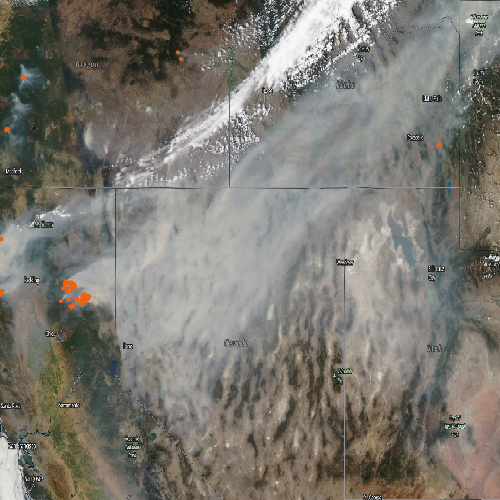

In [232]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

img = wms.getmap(layers=['BlueMarble_NextGeneration',
                         'MODIS_Aqua_CorrectedReflectance_TrueColor',
                         'MODIS_Aqua_Thermal_Anomalies_All',
                         'Reference_Features',
                         'Reference_Labels'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(-123,37,-110,45),  # Bounds (min-lon, min-lat, max-lon, max-lat)
                 size=(500, 500),  # Image size
                 time='2021-08-08',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# View image
Image(img.read())

In [575]:
modis_subset_date = datetime(2021,8,8)
modis_dixie_subset = firealarm_processing.data_subsetting(NEXUS_URL, 'MYD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean', {'min_lon': -125, 'max_lon': -100, 'min_lat': 30, 'max_lat': 50}, modis_subset_date, modis_subset_date)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/datainbounds?ds=MYD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean&b=-125,30,-100,50&startTime=2021-08-08T00:00:00Z&endTime=2021-08-08T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.7110011669574305 seconds


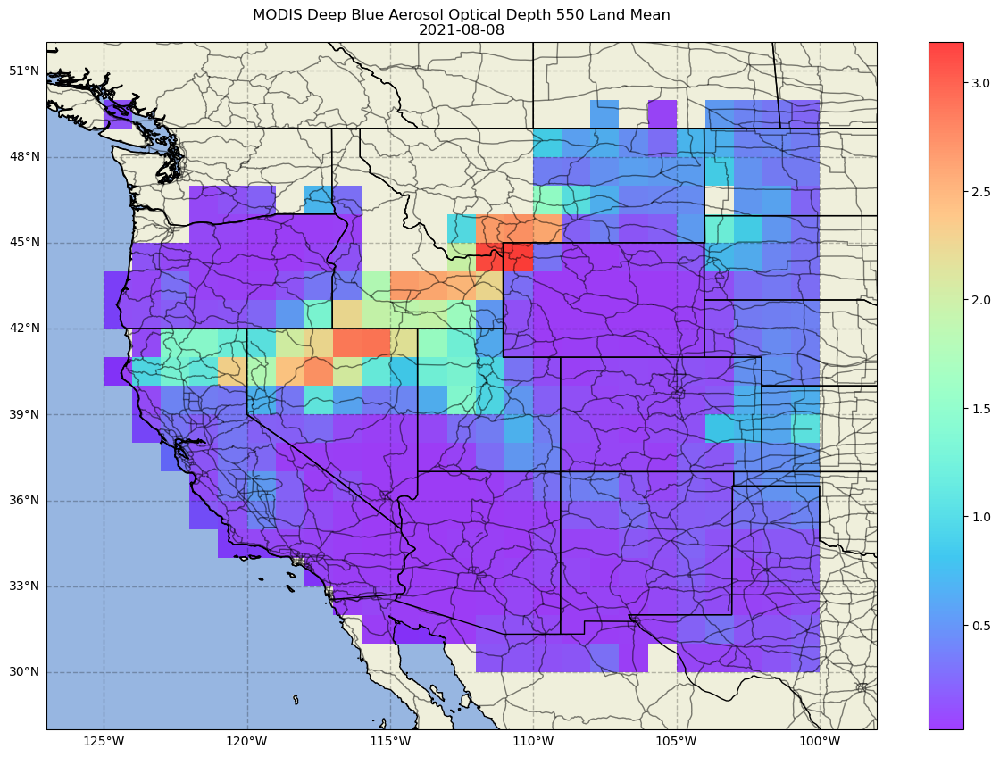

In [870]:
plotting.map_data(modis_dixie_subset[0], f'MODIS Deep Blue Aerosol Optical Depth 550 Land Mean\n{modis_subset_date.strftime("%Y-%m-%d")}')

#### AOD Longitude Hovmöller

In [577]:
wildfires_parameters = (NEXUS_URL, 'MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean', {'min_lon': -123, 'max_lon': -100, 'min_lat': 38, 'max_lat': 42}, datetime(2021,7,13), datetime(2021,9,20))
wildfires_lat_hov = firealarm_processing.hofmoeller(*wildfires_parameters, dim='longitude')

https://ideas-digitaltwin.jpl.nasa.gov/nexus/longitudeTimeHofMoellerSpark?ds=MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean&b=-123,38,-100,42&startTime=2021-07-13T00:00:00Z&endTime=2021-09-20T00:00:00Z

Waiting for response from FireAlarm... took 3.6158102919580415 seconds


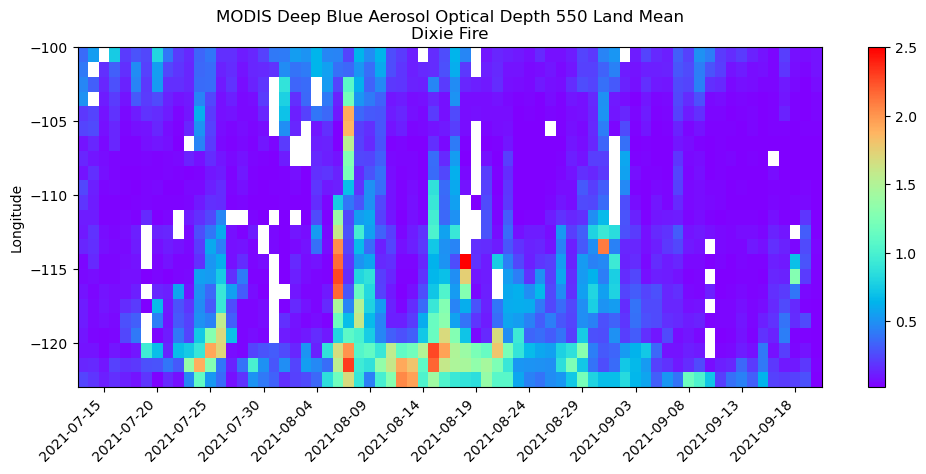

In [871]:
wildfires_hov_title = 'MODIS Deep Blue Aerosol Optical Depth 550 Land Mean\nDixie Fire'
plotting.heatmap(wildfires_lat_hov['mean'].transpose(), '', 'Longitude', wildfires_hov_title)

In [625]:
tropomi_co_dixie_map = firealarm_processing.temporal_mean(NEXUS_URL, 'TROPOMI-0.1deg-CA-CO', wildfires_bb, dixie_start, dixie_end)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeAvgMapSpark?ds=TROPOMI-0.1deg-CA-CO&b=-122,39,-120,41&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z

Waiting for response from FireAlarm... took 2.766768417088315 seconds


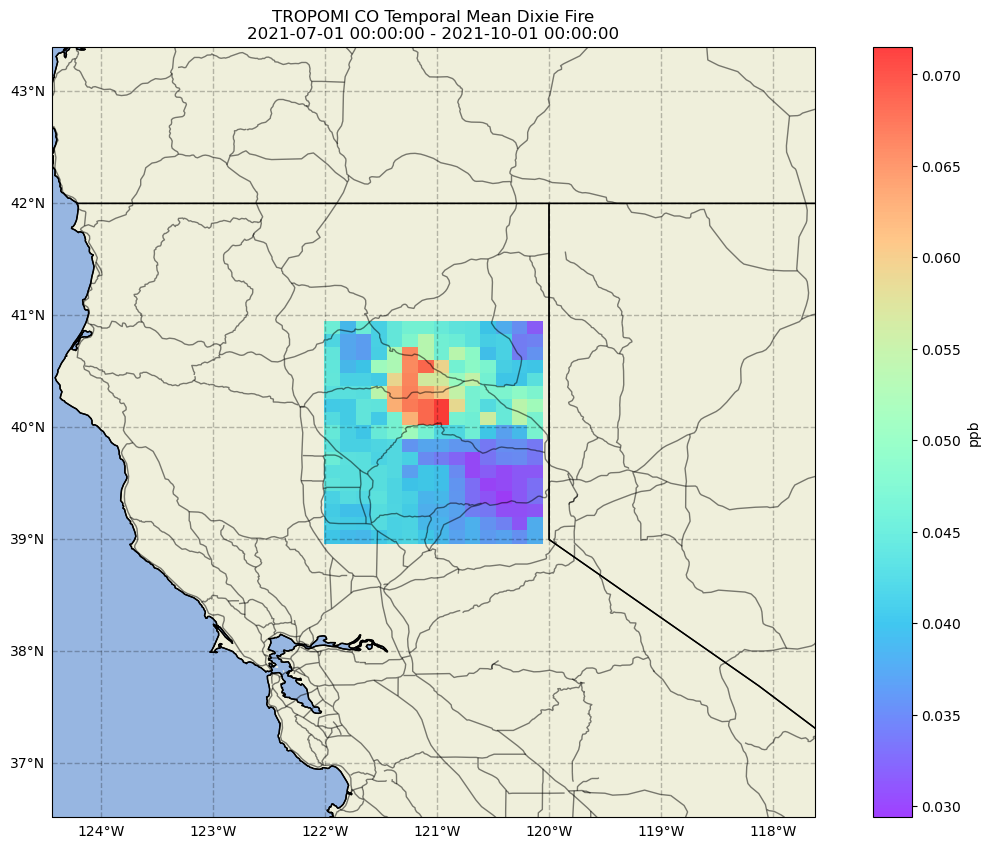

In [819]:
plotting.map_data(tropomi_co_dixie_map, f"TROPOMI CO Temporal Mean Dixie Fire\n{dixie_start} - {dixie_end}", cb_label='ppb')

In [ ]:
tropomi_co_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-CO', wildfires_bb, dixie_start, dixie_end)
tropomi_no2_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-NO2', wildfires_bb, dixie_start, dixie_end)
tropomi_o3_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-O3', wildfires_bb, dixie_start, dixie_end)
tropomi_ch4_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-CH4', wildfires_bb, dixie_start, dixie_end)
tropomi_so2_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-SO2', wildfires_bb, dixie_start, dixie_end)


https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-CO&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.5043525830842555 seconds
https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-NO2&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.719414749997668 seconds
https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-O3&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 1.0548284579999745 seconds
https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-CH4&minLon=-123&minLat=39&maxLon=-120&maxLat=42&startTime=2021-07-01T00:00:00Z

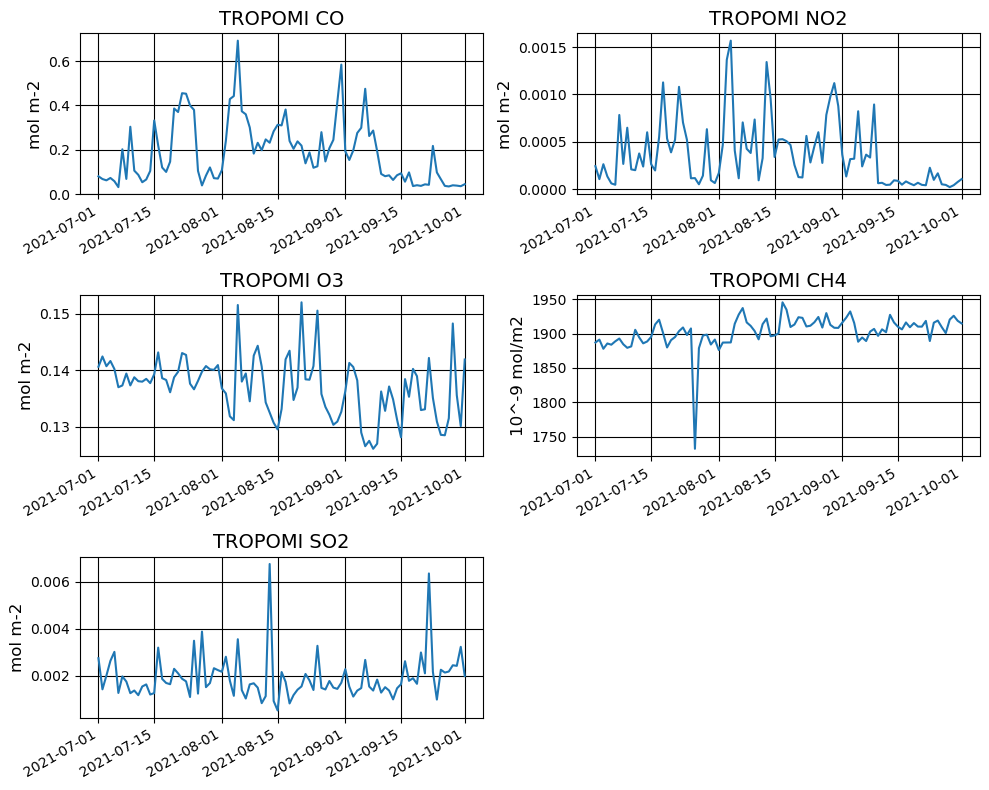

In [902]:
plotting.timeseries_multi_plot([(tropomi_co_dixie_ts['maximum'], 'TROPOMI CO', 'mol m-2'), (tropomi_no2_dixie_ts['maximum'], 'TROPOMI NO2', 'mol m-2'), (tropomi_o3_dixie_ts['maximum'], 'TROPOMI O3', 'mol m-2'), (tropomi_ch4_dixie_ts['maximum'], 'TROPOMI CH4', '10^-9 mol/m2'), (tropomi_so2_dixie_ts['maximum'], 'TROPOMI SO2', 'mol m-2')])

In [587]:
viirs_aot_dixie_ts =  firealarm_processing.spatial_timeseries(NEXUS_URL, 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean', wildfires_bb, dixie_start, dixie_end)
modis_aod_dixie_ts = firealarm_processing.spatial_timeseries(NEXUS_URL, 'MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean', wildfires_bb, dixie_start, dixie_end)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean&minLon=-122&minLat=39&maxLon=-120&maxLat=41&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 2.509598125005141 seconds
https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=MOD08_D3_6_1_Deep_Blue_Aerosol_Optical_Depth_550_Land_Mean&minLon=-122&minLat=39&maxLon=-120&maxLat=41&startTime=2021-07-01T00:00:00Z&endTime=2021-10-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.4821016250643879 seconds


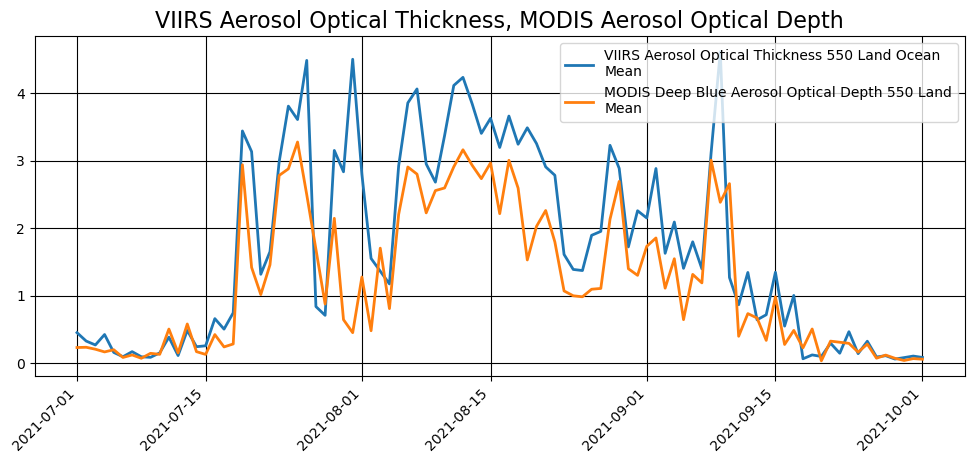

In [ ]:
plotting.timeseries_plot([(viirs_aot_dixie_ts['maximum'], 'VIIRS Aerosol Optical Thickness 550 Land Ocean Mean'), (modis_aod_dixie_ts['maximum'], 'MODIS Deep Blue Aerosol Optical Depth 550 Land Mean')], '', '', 'VIIRS Aerosol Optical Thickness, MODIS Aerosol Optical Depth', norm=False)

## In Situ sites

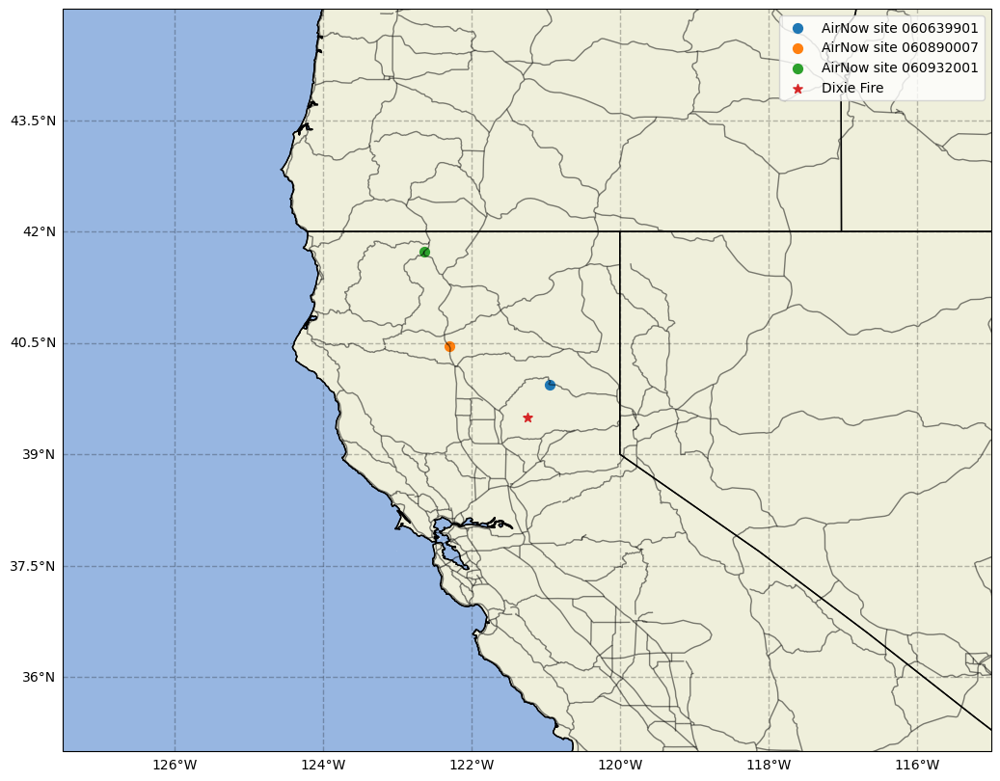

In [942]:
plotting.map_points([(39.93690, -120.94780, 'AirNow site 060639901'), (40.45310, -122.29780, 'AirNow site 060890007'), (41.72679, -122.63359, 'AirNow site 060932001'), (39.4908, -121.2508, 'Dixie Fire')], region='norcal')

In [897]:
dixie_insitu = firealarm_processing.insitu(NEXUS_URL, 'AirNow', 'AQACF', '-122,39,-120,40.5', datetime(2021,7,21), datetime(2021,8,1))

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=AirNow&project=AQACF&startTime=2021-07-21T00:00:00Z&endTime=2021-08-01T00:00:00Z&bbox=-122,39,-120,40.5
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=AirNow&project=AQACF&startTime=2021-07-21T00:00:00Z&endTime=2021-08-01T00:00:00Z&bbox=-122,39,-120,40.5&markerTime=2021-08-01T00:00:00Z&markerPlatform=599a973fde6cdd06073ce97341d103e3b97a282558d5b371f6d36c4316a8afcb


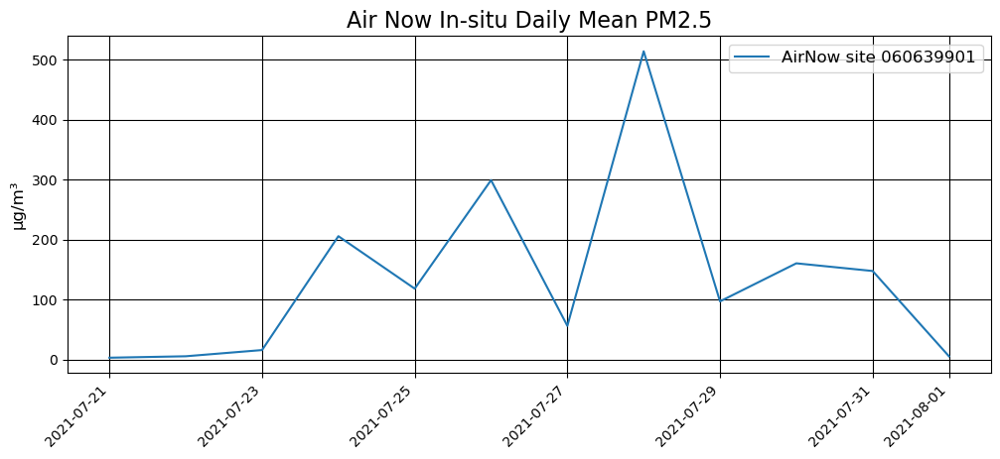

In [982]:
plotting.plot_insitu([(dixie_insitu[dixie_insitu['site'] == '060639901'], 'pm2_5', 'AirNow site 060639901')], 'Air Now In-situ Daily Mean PM2.5', 'µg/m³')

# 2023 Alberta, Canada Wildfires

In [948]:
canada_wildfires_bb = {'min_lon': -125, 'max_lon': -105, 'min_lat': 45, 'max_lat': 65}
canada_wildfires_start_time = datetime(2023,5,7)
canada_wildfires_end_time = datetime(2023,5,15)

canada_site_mapping = {
    'CC0092001': 'Grande Prairie - Henry Pirker',
    'CC0091501': 'Beaverlodge',
    'CC0092901': 'Edson'
}

In [946]:
canada_mean = firealarm_processing.temporal_mean(NEXUS_URL, 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean',canada_wildfires_bb, canada_wildfires_start_time, canada_wildfires_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeAvgMapSpark?ds=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean&b=-125,45,-105,65&startTime=2023-05-07T00:00:00Z&endTime=2023-05-15T00:00:00Z

Waiting for response from FireAlarm... took 0.6695520419161767 seconds


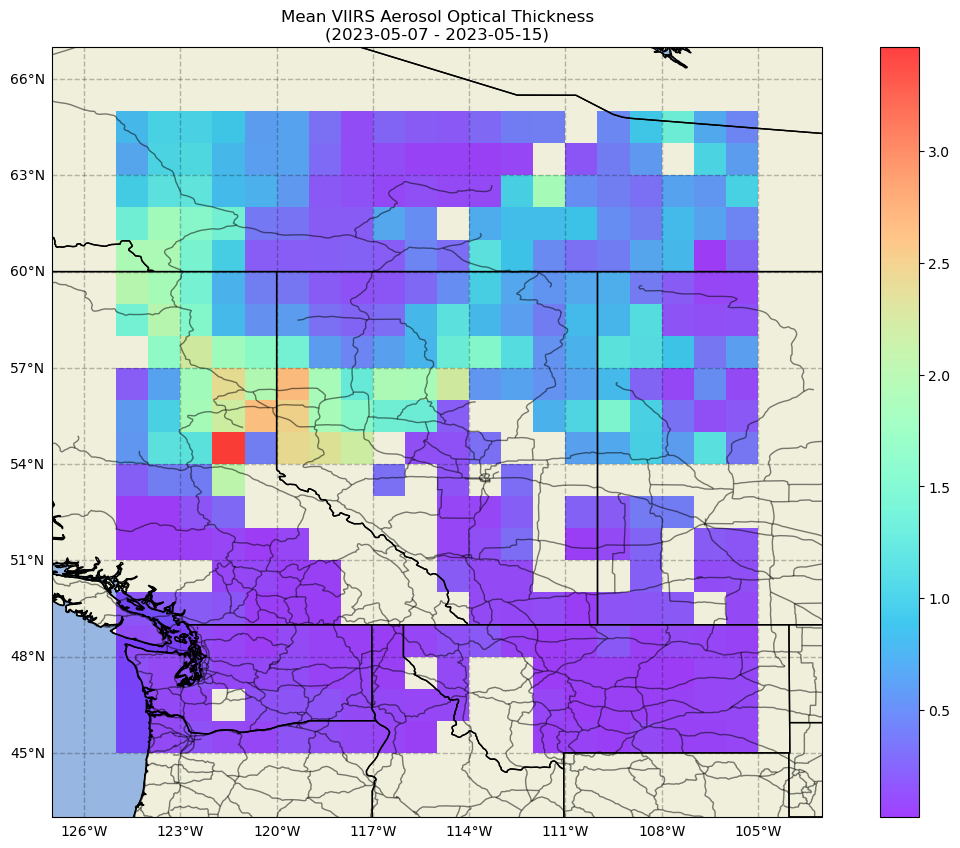

In [947]:
plotting.map_data(canada_mean, f'Mean VIIRS Aerosol Optical Thickness\n({canada_wildfires_start_time.strftime("%Y-%m-%d")} - {canada_wildfires_end_time.strftime("%Y-%m-%d")})')

## In Situ sites with proximity to May 2023 wildfires

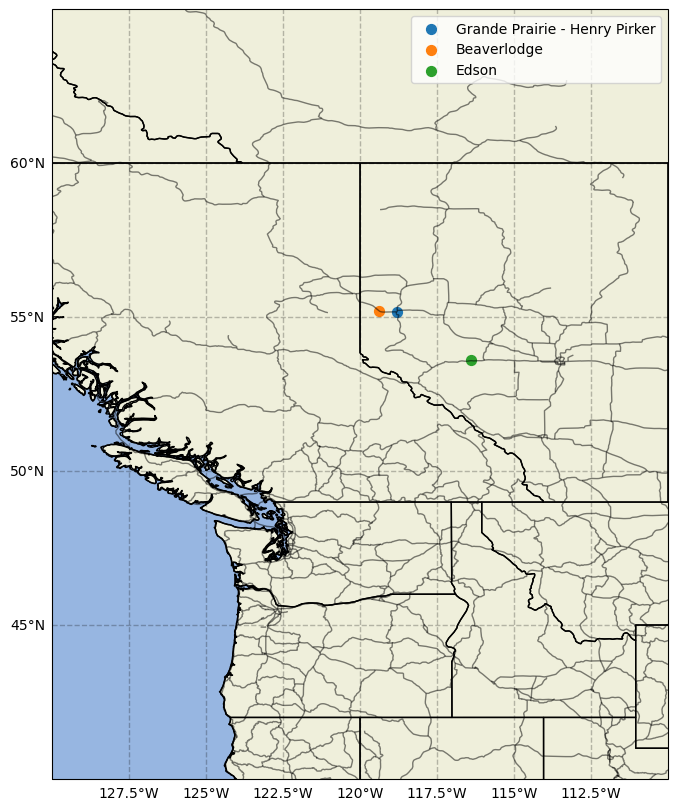

In [951]:
plotting.map_points([(55.176700, -118.806400, 'Grande Prairie - Henry Pirker'), (55.196400,-119.396700, 'Beaverlodge'), (53.593600,-116.392800, 'Edson')], region='alberta')

In [892]:
canada_wildfires_insitu = firealarm_processing.insitu(NEXUS_URL, 'AirNow', 'AQACF', '-119.5,53,-116,56', canada_wildfires_start_time, canada_wildfires_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=AirNow&project=AQACF&startTime=2023-05-01T00:00:00Z&endTime=2023-05-15T00:00:00Z&bbox=-119.5,53,-116,56
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=AirNow&project=AQACF&startTime=2023-05-01T00:00:00Z&endTime=2023-05-15T00:00:00Z&bbox=-119.5,53,-116,56&markerTime=2023-05-15T00:00:00Z&markerPlatform=8015a5b41b3e03cafd8e31b8451e753a9a24f7f765a3ac90624a038f3512d674


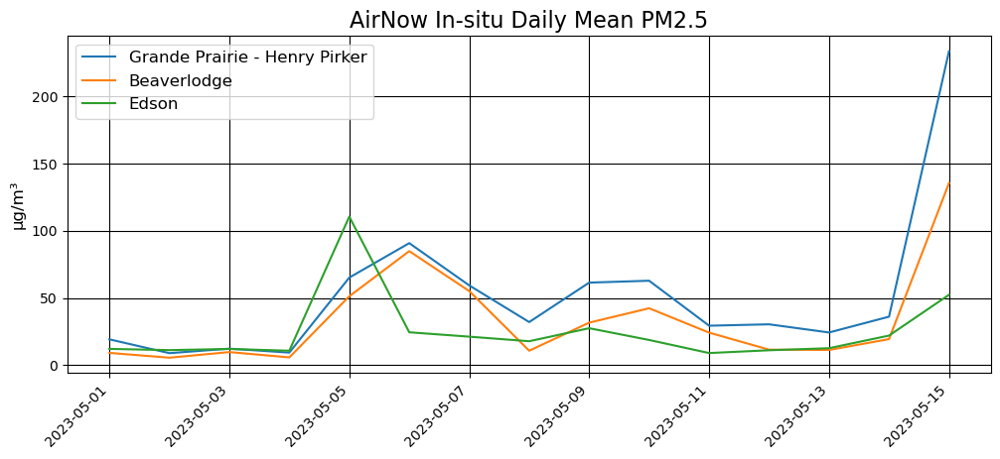

In [980]:
CC0092901_pm25 = canada_wildfires_insitu[canada_wildfires_insitu['site'] == 'CC0092901']
CC0091501_pm25 = canada_wildfires_insitu[canada_wildfires_insitu['site'] == 'CC0091501']
CC0092001_pm25 = canada_wildfires_insitu[canada_wildfires_insitu['site'] == 'CC0092001']

plotting.plot_insitu([(CC0092001_pm25, 'pm2_5', canada_site_mapping['CC0092001']),
                      (CC0091501_pm25, 'pm2_5', canada_site_mapping['CC0091501']),
                      (CC0092901_pm25, 'pm2_5', canada_site_mapping['CC0092901'])
                      ], 'AirNow In-situ Daily Mean PM2.5', 'µg/m³')

# 2018 Carr Wildfire


The Carr Fire was a large wildfire that burned in Shasta and Trinity Counties in California, United States. The fire started on July 23, 2018 and burned 229,651 acres, before it was 100% contained late on August 30, 2018.

Relevant Articles:
- https://www.mdpi.com/2073-4433/11/9/970 
- https://www.nps.gov/whis/learn/news/carrfire.htm

### Area of interest

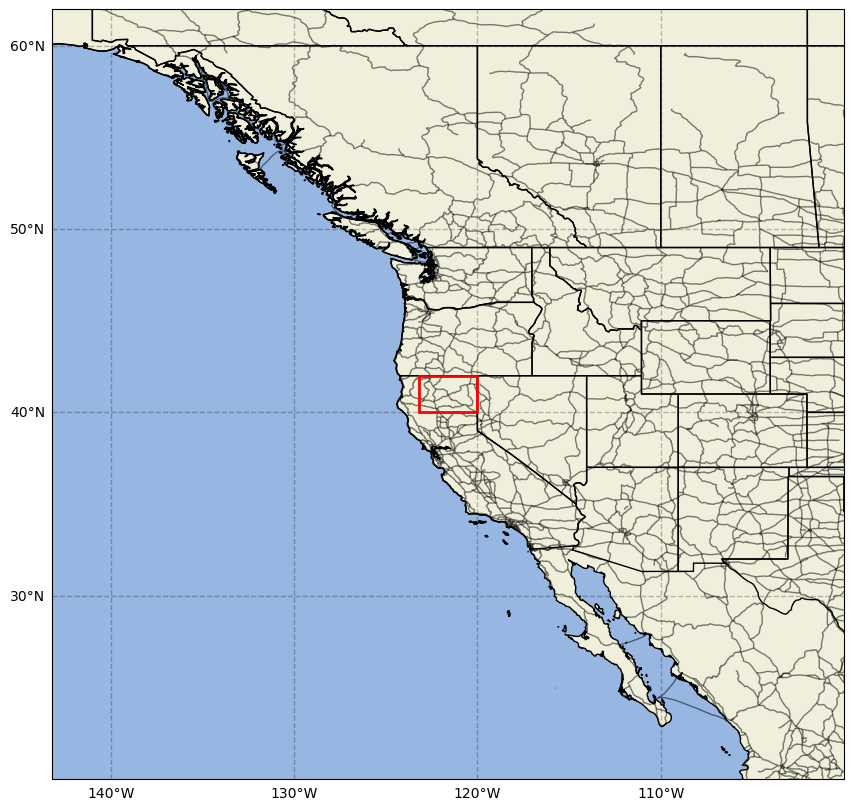

In [952]:
carr_bb = {
    'min_lon': -123.2,
    'max_lon': -120,
    'min_lat': 40,
    'max_lat': 42
}

carr_start_time = datetime(2018,6,15)
carr_end_time = datetime(2018,9,1)

plotting.map_box(carr_bb)

In [964]:
carr_GCHP_NO2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_NO2_D0', carr_bb, carr_start_time, carr_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=wustl-0.1degx0.1deg-daily-ca-SpeciesConc_NO2_D0&minLon=-123.2&minLat=40&maxLon=-120&maxLat=42&startTime=2018-06-15T00:00:00Z&endTime=2018-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 2.9745432920753956 seconds


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


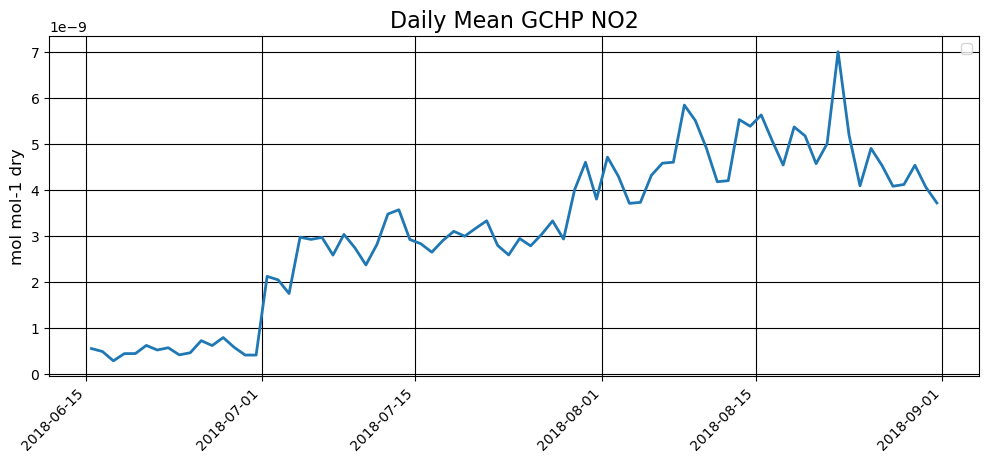

In [976]:
plotting.timeseries_plot([(carr_GCHP_NO2['mean'], '')], '', 'mol mol-1 dry', 'Daily Mean GCHP NO2')

In [955]:
carr_O3 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0', carr_bb, carr_start_time, carr_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0&minLon=-123.2&minLat=40&maxLon=-120&maxLat=42&startTime=2018-06-15T00:00:00Z&endTime=2018-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.3942875830689445 seconds


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


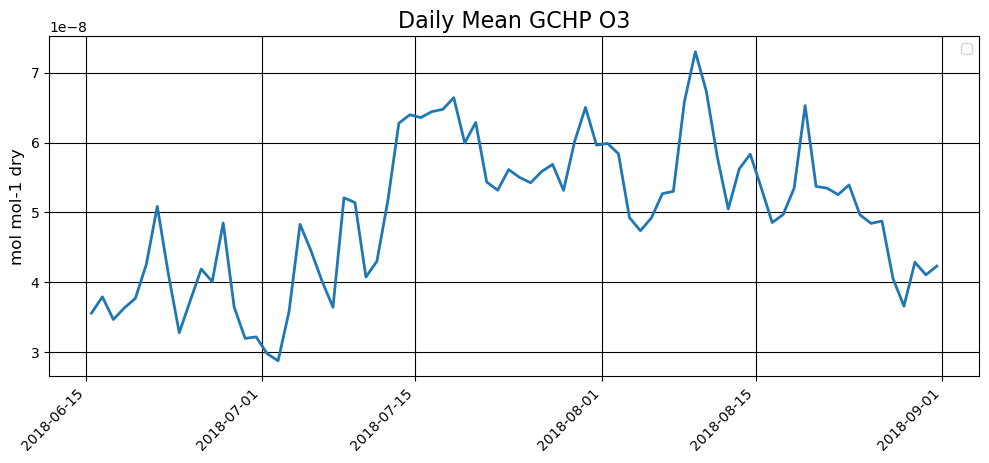

In [975]:
plotting.timeseries_plot([(carr_O3['mean'], '')], '', 'mol mol-1 dry', 'Daily Mean GCHP O3')

In [965]:
carr_temp_var_O3 = firealarm_processing.temporal_variance(NEXUS_URL, 'wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0', carr_bb, carr_start_time, carr_end_time)

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/varianceSpark?ds=wustl-0.1degx0.1deg-daily-ca-SpeciesConc_O3_D0&minLon=-123.2&minLat=40&maxLon=-120&maxLat=42&startTime=2018-06-15T00:00:00Z&endTime=2018-09-01T00:00:00Z

Waiting for response from FireAlarm... took 2.2130664590513334 seconds


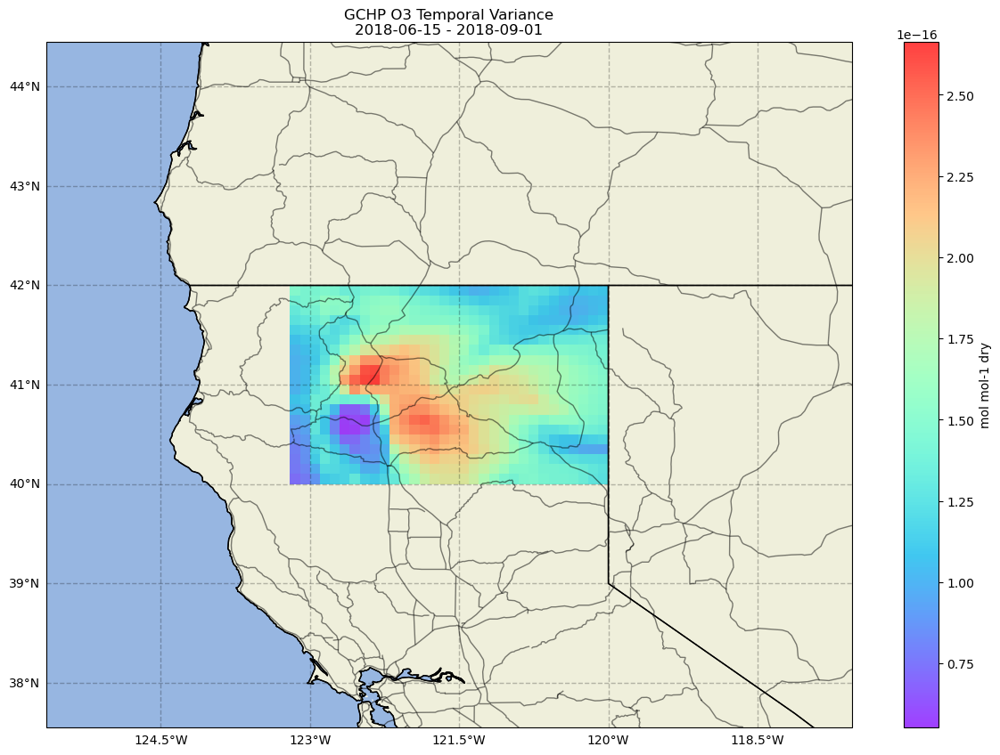

In [977]:
carr_variance_title = f'GCHP O3 Temporal Variance\n{str(carr_start_time)[:10]} - {str(carr_end_time)[:10]}'
plotting.map_data(carr_temp_var_O3, carr_variance_title, cb_label='mol mol-1 dry')

# Los Angeles ports backlog Fall 2021
Beginning around October 2021, the Ports of Los Angeles and Long Beach started suffering serious backlogs of ships due a surge in e-commerence because of the COVID-19 pandemic. This resulted in many ships anchored in the ports and releasing high amounts of pollutants. 

Relevant Articles:
- https://earthobservatory.nasa.gov/images/149004/scientific-questions-arrive-in-ports
- https://earthobservatory.nasa.gov/images/148956/waiting-to-unload
- https://www.whitehouse.gov/briefing-room/statements-releases/2021/10/13/fact-sheet-biden-administration-efforts-to-address-bottlenecks-at-ports-of-los-angeles-and-long-beach-moving-goods-from-ship-to-shelf/ 

This usecase highlights the support for federated deployments. The PM2.5 analysis is seamlessly generated from a federated deployment hosted by GMU. 

### Area of interest

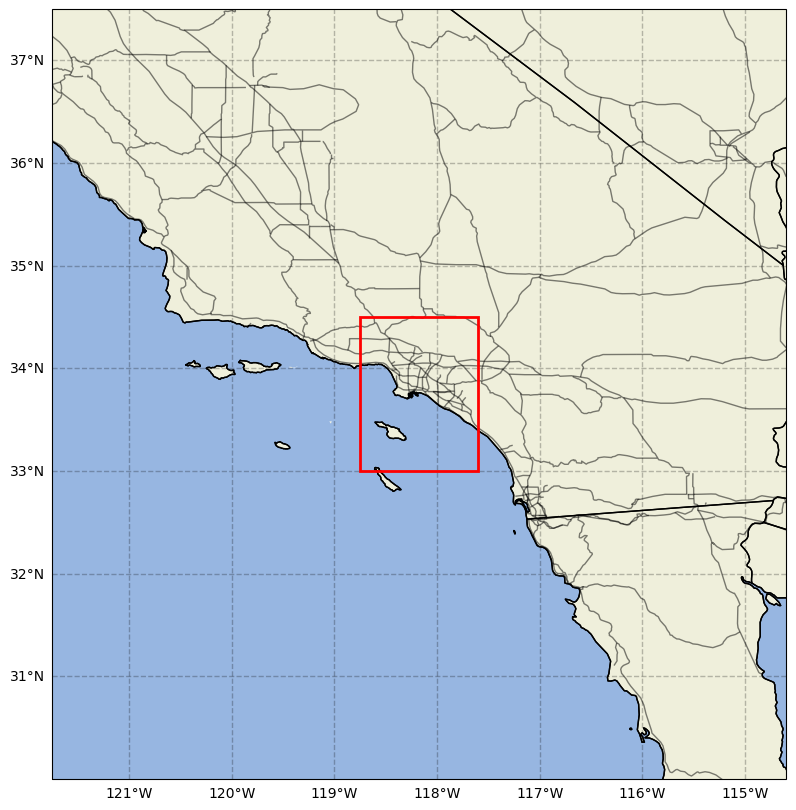

In [967]:
la_ports_bb = {
    'min_lon': -118.75,
    'max_lon': -117.6,
    'min_lat': 33,
    'max_lat': 34.5
}

la_ports_start_time = datetime(2021,10,1)
la_ports_end_time = datetime(2022,1,1)

plotting.map_box(la_ports_bb, padding=3)

In [685]:
la_ports_tropomi_no2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-NO2', la_ports_bb, la_ports_start_time, la_ports_end_time)
la_ports_tropomi_so2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'TROPOMI-0.1deg-CA-SO2', la_ports_bb, la_ports_start_time, la_ports_end_time)
la_ports_gmu_pm25 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'GMU-PM25', la_ports_bb, la_ports_start_time, la_ports_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-NO2&minLon=-118.75&minLat=33&maxLon=-117.6&maxLat=34.5&startTime=2021-10-01T00:00:00Z&endTime=2022-01-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 2.597638541017659 seconds
https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TROPOMI-0.1deg-CA-SO2&minLon=-118.75&minLat=33&maxLon=-117.6&maxLat=34.5&startTime=2021-10-01T00:00:00Z&endTime=2022-01-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 0.3441210840828717 seconds
https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=GMU-PM25&minLon=-118.75&minLat=33&maxLon=-117.6&maxLat=34.5&startTime=2021-10-01T00:00:00Z&endTime=2022-01-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 10.321100375032984 seconds


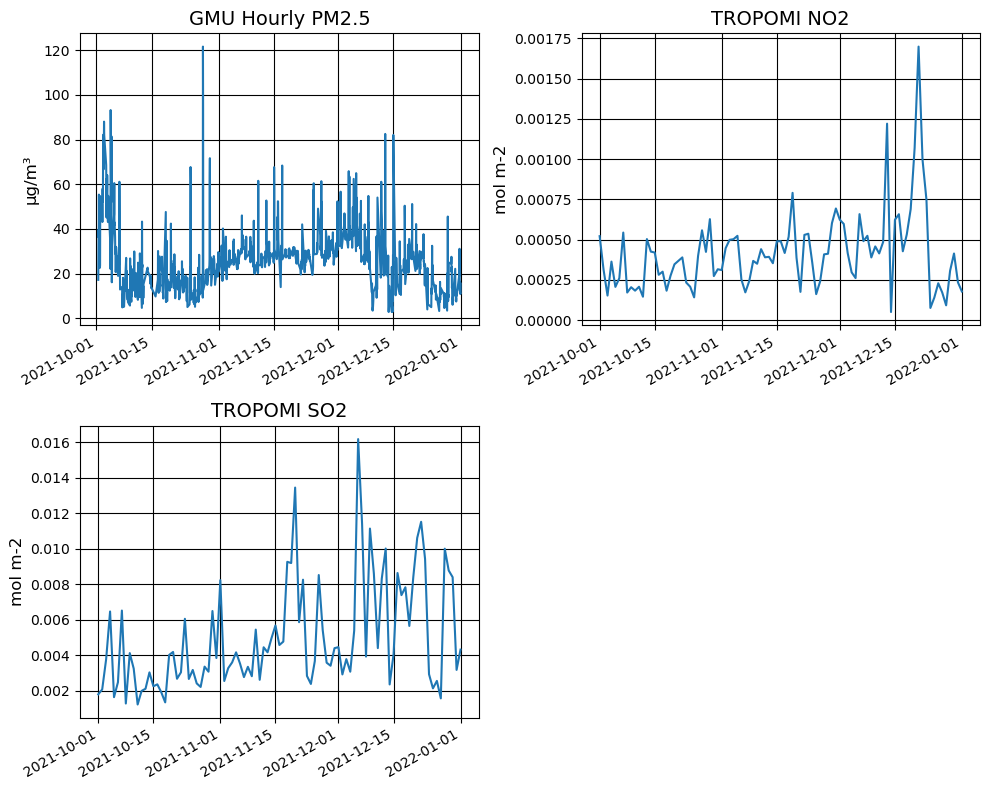

In [979]:
plotting.timeseries_multi_plot([(la_ports_gmu_pm25['maximum'], 'GMU Hourly PM2.5', 'µg/m³'), (la_ports_tropomi_no2['maximum'], 'TROPOMI NO2', 'mol m-2'), (la_ports_tropomi_so2['maximum'], 'TROPOMI SO2', 'mol m-2')])

In [687]:
la_ports_SO2_daily_diff_data = firealarm_processing.daily_diff(NEXUS_URL, 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean', 'laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean_clim', la_ports_bb, la_ports_start_time, la_ports_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/dailydifferenceaverage_spark?dataset=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean&climatology=laads-1degx1deg-daily-global_Aerosol_Optical_Thickness_550_Land_Ocean_Mean_clim&b=-118.75,33,-117.6,34.5&startTime=2021-10-01T00:00:00Z&endTime=2022-01-01T00:00:00Z

Waiting for response from FireAlarm... took 3.24830308300443 seconds


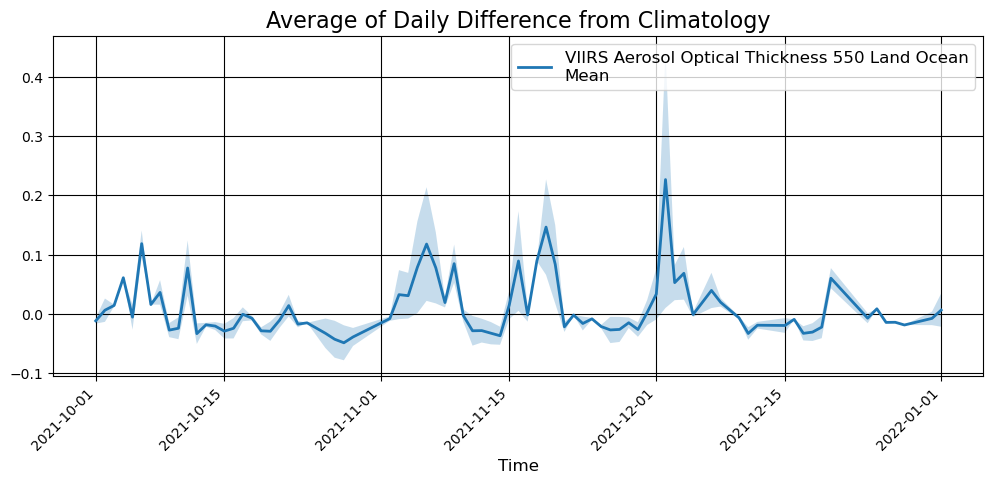

In [828]:
plotting.timeseries_bands_plot(la_ports_SO2_daily_diff_data, 'VIIRS Aerosol Optical Thickness 550 Land Ocean Mean', 'Time', '', 'Average of Daily Difference from Climatology')

In [1011]:
# Connect to FireAlarm OnEarth WMS Service
wms = WebMapService('https://ideas-digitaltwin.jpl.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers = ['BlueMarble_NextGeneration',
          'TROPOMI_nitrogendioxide_tropospheric_column',
          'Reference_Features',
          'Reference_Labels']
font = ImageFont.truetype('Roboto-Bold.ttf', size=18)
color = 'rgb(255,255,255)'
frames = []

dates = pd.date_range(la_ports_start_time,la_ports_end_time-timedelta(days=1),freq='d')

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(-122, 32.5, -114, 38), # Bounds
                     size=(500, 500),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 12)
    draw.text((x, y), f'TROPOMI NO2 Total Column  - {datatime}', fill=color, font=font)
    frames.append(image)

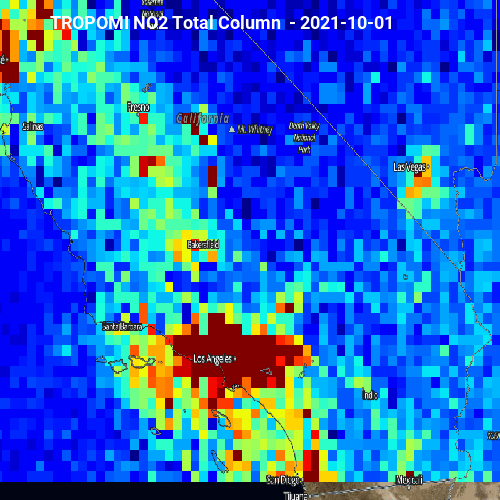

In [1012]:
frames[0].save('TROPOMI_nitrogendioxide_tropospheric_column.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=500,
               loop=0)

Image('TROPOMI_nitrogendioxide_tropospheric_column.gif')

# Fireworks during 4th of July 2022 in Los Angeles County
Despite fireworks being outlawed for personal use in Los Angeles County, there is a significant amount of illegal fireworks displays in the area around 4th of July that cause very smoggy conditions.  
Below we model our in situ Particulate matter 2.5 and Black Carbon data from around 4th of July 

Relevant Articles:
- http://www.aqmd.gov/docs/default-source/news-archive/2022/fireworks-advisory-7-2-2022.pdf
- https://www.latimes.com/california/story/2022-07-05/poor-air-quality-lingering-in-los-angeles-after-fourth-of-firework-shows 

### Area of Interest

In [544]:
la_fireworks_bb = {
    'min_lon': -118.4,
    'max_lon': -118,
    'min_lat': 33.75,
    'max_lat': 34.3
}
la_fireworks_start_time = datetime(2021,6,1)
la_fireworks_end_time = datetime(2021,7,14)

### Get PM 2.5 and Black Carbon (BC) from B301 GRIMM Aethalometer (2021-06-28 to 2021-07-11)

In [984]:
bb_string_fireworks       = '-120,30,-115,40'
provider_fireworks        = 'GRIMM-Aethalometer'

pm25_bc_2021_fireworks = firealarm_processing.insitu(NEXUS_URL, provider_fireworks, 'AQACF', 
                                                 bb_string_fireworks, datetime(2021,6,24), 
                                                 datetime(2021,7,6))

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=GRIMM-Aethalometer&project=AQACF&startTime=2021-06-24T00:00:00Z&endTime=2021-07-06T00:00:00Z&bbox=-120,30,-115,40
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=GRIMM-Aethalometer&project=AQACF&startTime=2021-06-24T00:00:00Z&endTime=2021-07-06T00:00:00Z&bbox=-120,30,-115,40&markerTime=2021-07-06T00:00:00Z&markerPlatform=80b821d13896370adeded9827bd2118c35c1b980a8be1cdb91dea5f6384133e1


### Get PM 2.5 and Black Carbon (BC) from B301 GRIMM Aethalometer (2022-06-28 to 2022-07-11)

In [986]:
pm25_bc_2022_fireworks = firealarm_processing.insitu(NEXUS_URL, provider_fireworks, 'AQACF', 
                                                 bb_string_fireworks, datetime(2022,6,24),  datetime(2022,7,6))

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=GRIMM-Aethalometer&project=AQACF&startTime=2022-06-24T00:00:00Z&endTime=2022-07-06T00:00:00Z&bbox=-120,30,-115,40
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=GRIMM-Aethalometer&project=AQACF&startTime=2022-06-24T00:00:00Z&endTime=2022-07-06T00:00:00Z&bbox=-120,30,-115,40&markerTime=2022-07-06T00:00:00Z&markerPlatform=a121d5f6cbb9e176fe769de8c38c266cc8985a059625458c7d122c390556e071


In [987]:
pm25_bc_2021_fireworks_time = pm25_bc_2021_fireworks.copy(deep=True)
pm25_bc_2021_fireworks_time.time = pm25_bc_2021_fireworks_time.time + np.timedelta64(1, 'Y')

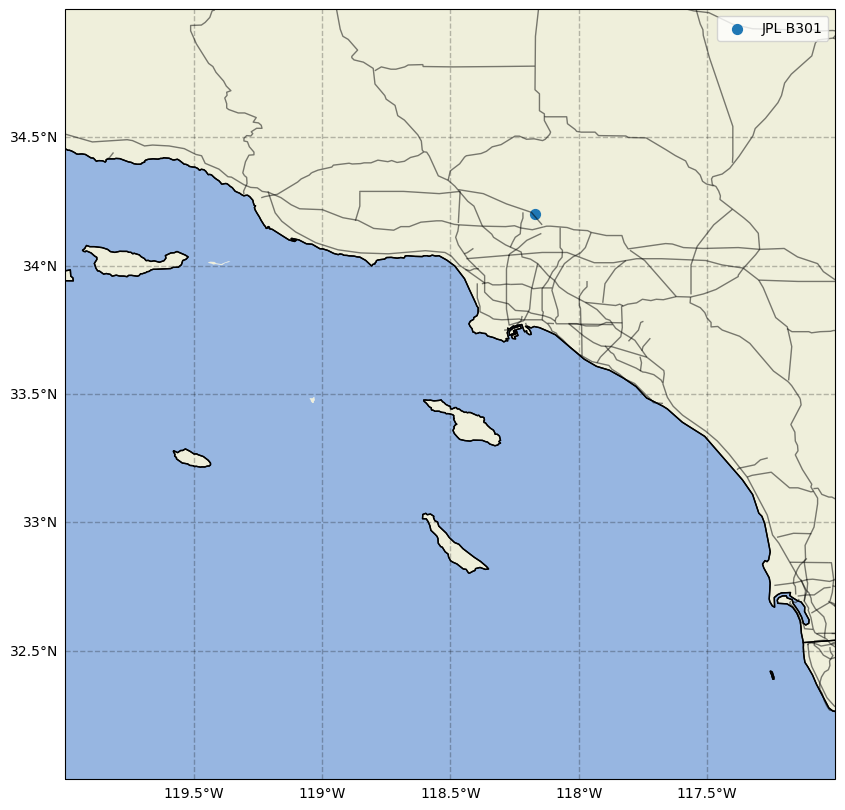

In [988]:
plotting.map_points([(pm25_bc_2021_fireworks_time.latitude.values[0], pm25_bc_2021_fireworks_time.longitude.values[0], 'JPL B301')], region='la')

## Compare 2021 and 2022 emissions 
Unlike last year, PM2.5 levels showed only a minor elevation during the night of July 4th. However, a large peak (up to 100 µg/m3) was observed during the morning of July 5th, comparable to the levels measured last year, most likely due to the transport of smoke from South/Central LA.

As expected, Black Carbon (BC) levels did not show an appreciable increase during the fireworks event. Fireworks do not emit very large amounts of BC relative to other species. Organic and inorganic aerosols (particularly metals) dominate emissions from fireworks. A PM2.5 sample was collected, using the Aerosol Mass and Optical Depth (AMOD) instrument, for chemical analysis which includes X-ray fluorescence (XRF) spectroscopy for detection of metals.

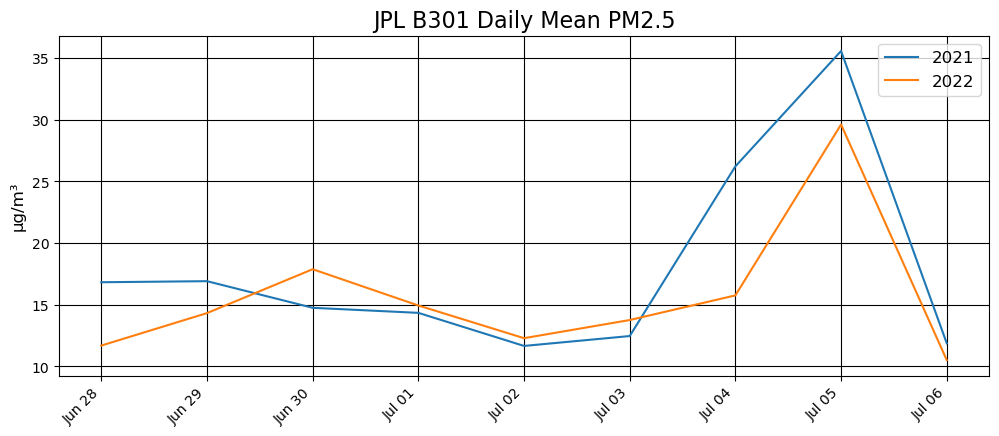

In [990]:
plotting.plot_insitu([(pm25_bc_2021_fireworks_time, 'pm2_5', '2021'), (pm25_bc_2022_fireworks, 'pm2_5', '2022')], 'JPL B301 Daily Mean PM2.5', 'µg/m³', shared_year=True)

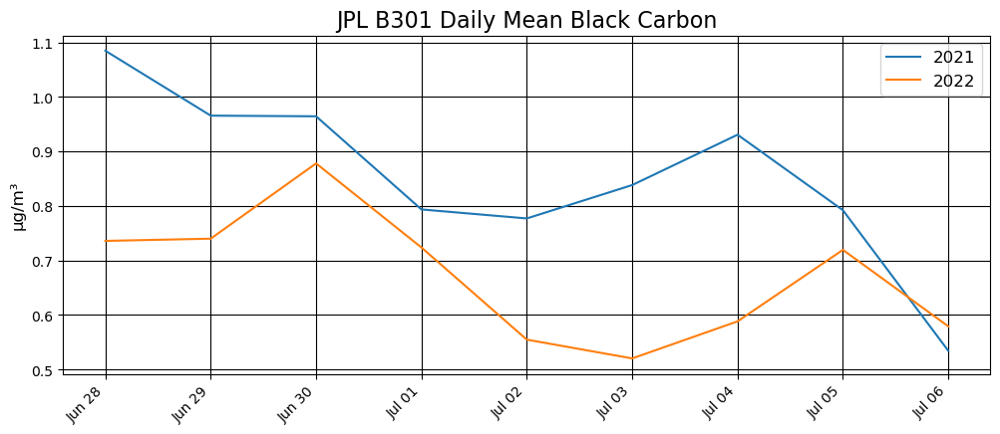

In [991]:
plotting.plot_insitu([(pm25_bc_2021_fireworks_time, 'bc', '2021'), (pm25_bc_2022_fireworks, 'bc', '2022')], 'JPL B301 Daily Mean Black Carbon', 'µg/m³', shared_year=True)

In [992]:
pm25_pm_2022_purpleair = firealarm_processing.insitu(NEXUS_URL, 'PurpleAir', 'AQACF', 
                                                 bb_string_fireworks, datetime(2022,6,24),  datetime(2022,7,6))

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=PurpleAir&project=AQACF&startTime=2022-06-24T00:00:00Z&endTime=2022-07-06T00:00:00Z&bbox=-120,30,-115,40
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=PurpleAir&project=AQACF&startTime=2022-06-24T00:00:00Z&endTime=2022-07-06T00:00:00Z&bbox=-120,30,-115,40&markerTime=2022-07-06T00:00:00Z&markerPlatform=3e9194a14f07e74590fe99cd20b8b12dd6313cebb9d87e5a8292176825214da6


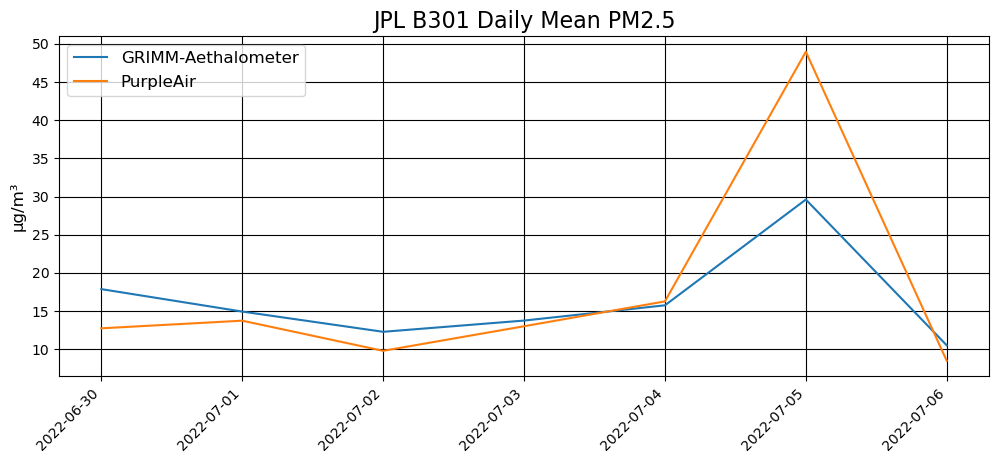

In [1002]:
plotting.plot_insitu([(pm25_bc_2022_fireworks[2:], 'pm2_5', 'GRIMM-Aethalometer'), (pm25_pm_2022_purpleair, 'pm2_5', 'PurpleAir')], 'JPL B301 Daily Mean PM2.5', 'µg/m³', shared_year=False)

# Predicting What We Breath (PWWB)

In [690]:
pwwb_PM25 = 'PWWB_200_daily_PM25'
pwwb_bb = {
    'min_lon': -120,
    'max_lon': -117,
    'min_lat': 32,
    'max_lat': 35
}

pwwb_start_time = datetime(2023, 5, 10)
pwwb_end_time = datetime.today()

In [872]:
pwwb_data = firealarm_processing.data_subsetting(NEXUS_URL, pwwb_PM25, pwwb_bb, datetime(2023, 5, 15), datetime(2023, 5, 15))

https://ideas-digitaltwin.jpl.nasa.gov/nexus/datainbounds?ds=PWWB_200_daily_PM25&b=-120,32,-117,35&startTime=2023-05-17T00:00:00Z&endTime=2023-05-17T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 3.8830310839693993 seconds


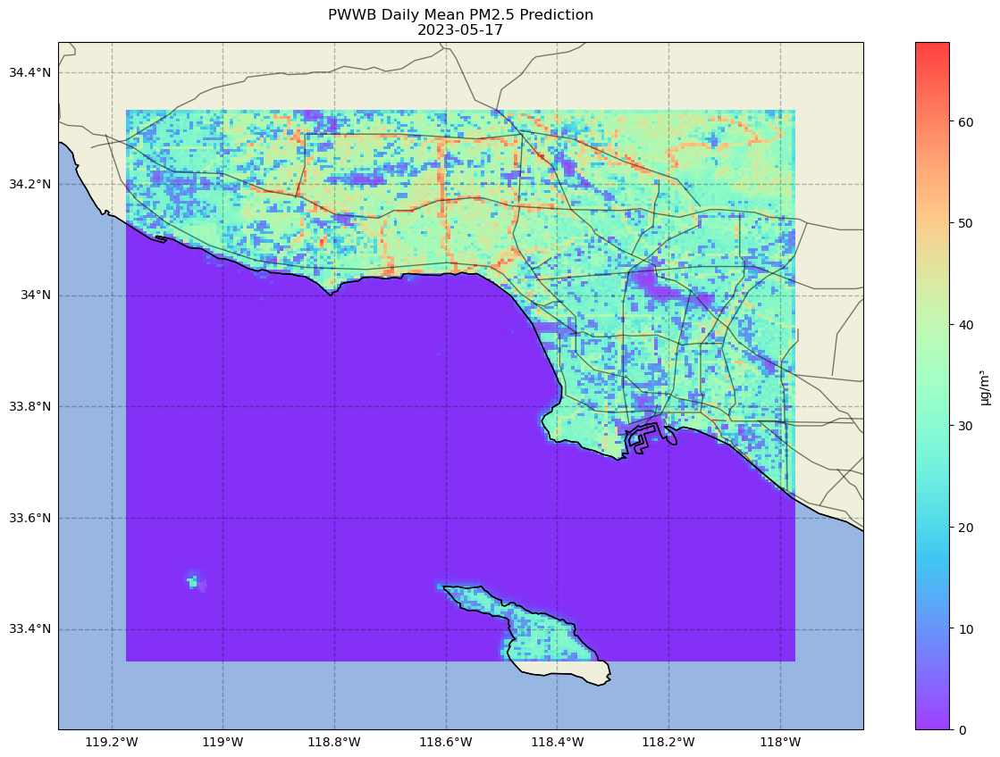

In [873]:
plotting.map_data(pwwb_data[0], f'PWWB Daily Mean PM2.5 Prediction\n{str(pwwb_data[0].time.values)[:10]}', padding=0.125, cb_label='µg/m³')

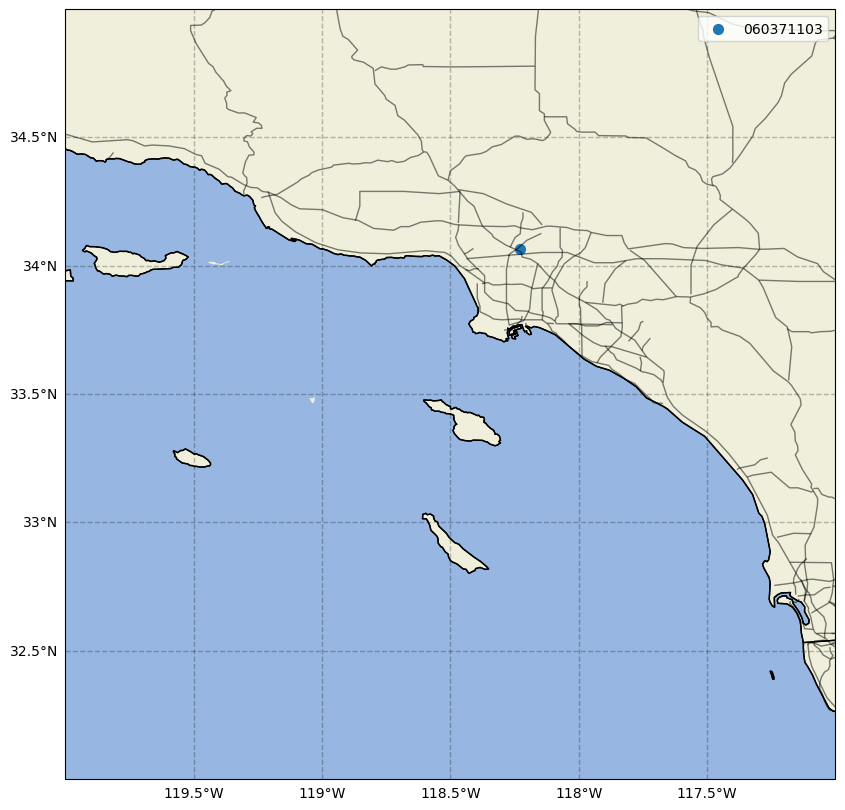

In [867]:
plotting.map_points([(34.066429,-118.226755, '060371103')], region='la')

In [864]:
pwwb_in_situ = firealarm_processing.insitu(NEXUS_URL, 'AirNow', 'AQACF', '-118.25, 34,-118.2, 34.24', datetime(2023,5,14), datetime(2023,5,15))

https://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=AirNow&project=AQACF&startTime=2023-05-14T00:00:00Z&endTime=2023-05-15T00:00:00Z&bbox=-118.25, 34,-118.2, 34.24
http://ideas-digitaltwin.jpl.nasa.gov/insitu/1.0/query_data_doms_custom_pagination?startIndex=0&itemsPerPage=100000&provider=AirNow&project=AQACF&startTime=2023-05-14T00:00:00Z&endTime=2023-05-15T00:00:00Z&bbox=-118.25, 34,-118.2, 34.24&markerTime=2023-05-15T00:00:00Z&markerPlatform=03b77c10fddfb6e8519c75317ae6454211d46c28964177591b972af0de002624


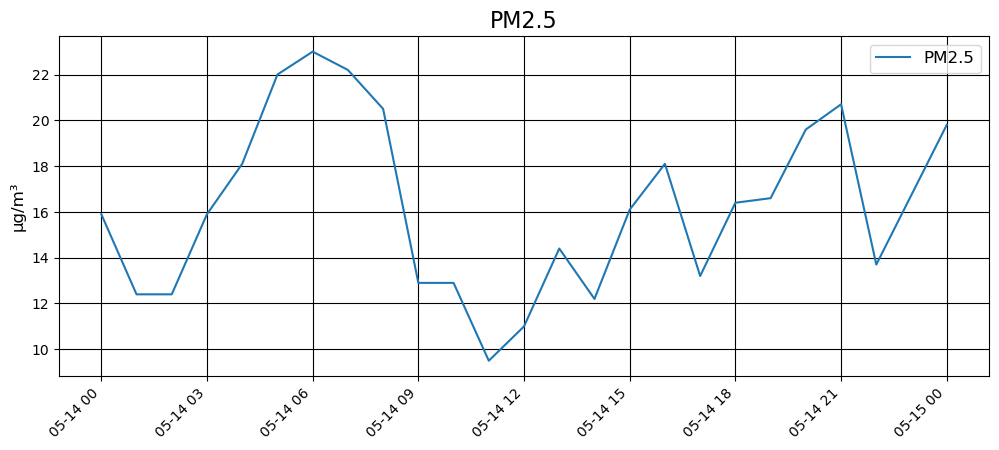

In [866]:
plotting.plot_insitu([(pwwb_in_situ, 'pm2_5','PM2.5')], 'PM2.5', 'µg/m³')

# 

# Air Pollution in the Yellow Sea

The Yellow Sea is a marginal sea of the Western Pacific Ocean located between mainland China and the Korean Peninsula. It is considered among the most degraded marine areas on earth. Loss of natural coastal habitats due to land reclamation has resulted in the destruction of more than 60% of tidal wetlands around the Yellow Sea. 

Every year, China invokes sustainability to unilaterally impose a ban on fishing in the Yellow Sea, Bohai Sea, East China Sea, and the waters north of 12 degrees latitude in the South China Sea. This ban is in effect from May 1 to August 16 and is enforced by the Chinese Coast Guard.

China is one of the largest maritime states and has the largest fishery catch in the world. The large number of fishing vessels in the Yellow Sea has increased the air pollution. 

Pollution also tends to increase in the winter as an increased amount of fuel is burned.  Furthermore dense cold air traps pollutants near the surface of the earth which increases air pollution levels.

Relevant Articles:
- http://english.www.gov.cn/news/topnews/202205/02/content_WS626f2b06c6d02e533532a2a1.html 

### Area of Interest

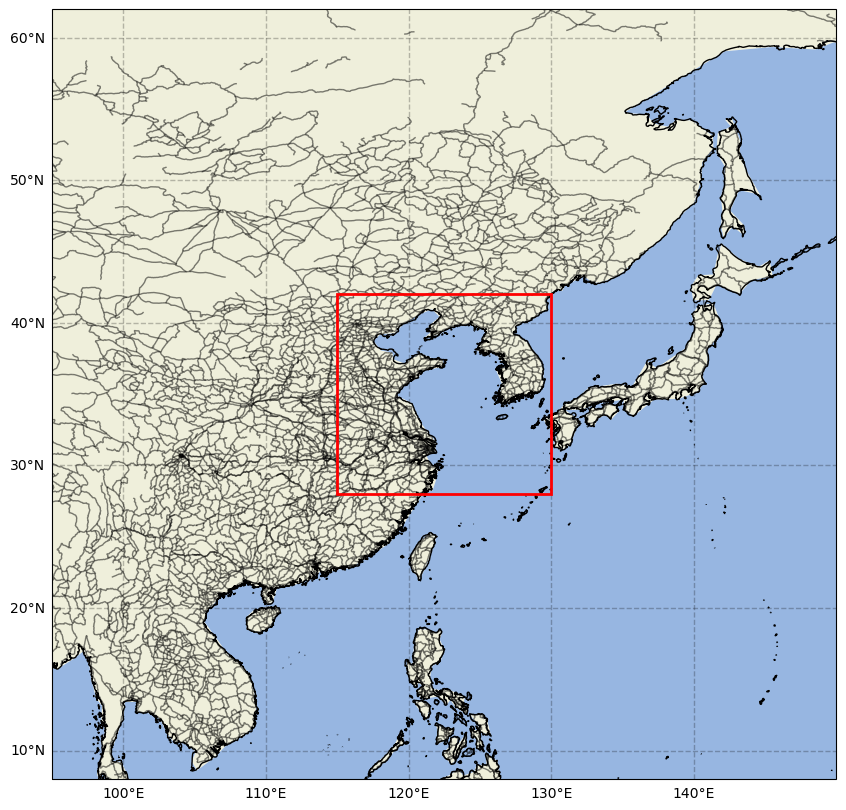

In [846]:
yellow_sea_start_time = datetime(2020, 1, 1)
yellow_sea_end_time = datetime(2020, 12, 1)

yellow_sea_bb = {'min_lon': 115, 'max_lon': 130, 'min_lat': 28, 'max_lat': 42}
plotting.map_box(yellow_sea_bb)

### Air Quality: May vs. February in the Yellow Sea 

The below graphs are a visualization of Aerosol Optical Depth (AOD) data. Aerosol Optical Depth is the measure of aerosols (e.g., urban haze, smoke. particles, desert dust) distributed within a column of air. 


### Generate Legend

In [273]:
wmsUrl = 'https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?\
SERVICE=WMS&REQUEST=GetCapabilities'

response = requests.get(wmsUrl)
WmsTree = xmlet.fromstring(response.content)

legendImg = None
for child in WmsTree.iter():
    for layer in child.findall("./{http://www.opengis.net/wms}Capability/{http://www.opengis.net/wms}Layer//*/"): 
         if layer.tag == '{http://www.opengis.net/wms}Layer': 
            f = layer.find("{http://www.opengis.net/wms}Name")
            if f is not None:
                if f.text == "MODIS_Combined_Value_Added_AOD":
                    # Style
                    e = layer.find(("{http://www.opengis.net/wms}Style/" +
                                    "{http://www.opengis.net/wms}LegendURL/" +
                                    "{http://www.opengis.net/wms}OnlineResource"))
                    legendURL = e.attrib["{http://www.w3.org/1999/xlink}href"]
                    combinedLegendImg = Image(url=legendURL)
                    
#display(combinedLegendImg)

### May (Summer & Fishing Moratorium)

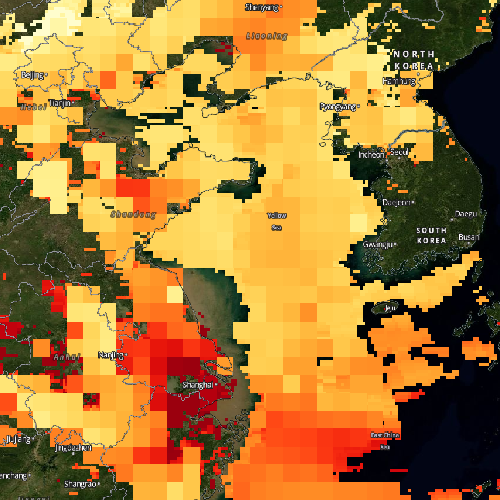

In [274]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

img = wms.getmap(layers=['BlueMarble_NextGeneration',
                         'MODIS_Terra_Aerosol', 
                         'MODIS_Aqua_Aerosol', 
                         'MODIS_Combined_Value_Added_AOD',
                         'Reference_Features',
                         'Reference_Labels'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(115, 28, 130, 42),  # Bounds (min-lon, min-lat, max-lon, max-lat) -> min lon: 115.179845, min lat: 28.087158,130.209142,41.718570
                 size=(500, 500),  # Image size
                 time='2021-05-02',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# View image and legend
display(combinedLegendImg)
Image(img.read())

### February (Winter & Fishing Season)

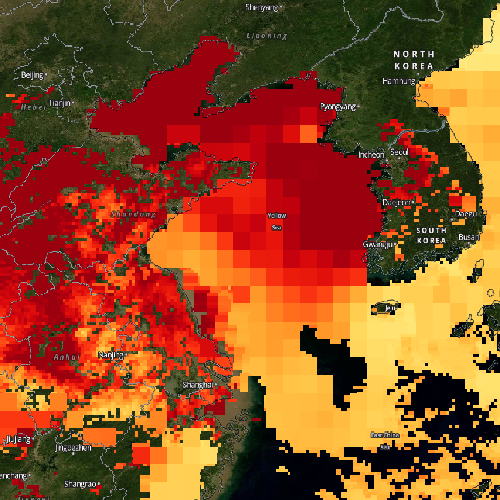

In [275]:
# Connect to GIBS WMS Service
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

img = wms.getmap(layers=['BlueMarble_NextGeneration',
                         'MODIS_Terra_Aerosol',
                         'MODIS_Aqua_Aerosol', 
                         'MODIS_Combined_Value_Added_AOD',
                         'Reference_Features',
                         'Reference_Labels'],  # Layers
                 srs='epsg:4326',  # Map projection
                 bbox=(115, 28, 130, 42),  # Bounds (min-lon, min-lat, max-lon, max-lat)
                 size=(500, 500),  # Image size
                 time='2022-02-25',  # Time of data
                 format='image/png',  # Image format
                 transparent=True)  # Nodata transparency

# View image and legend
display(combinedLegendImg)
Image(img.read())

### NO2 Levels

#### NO2 Spatial Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=GMU-OMI-0.25deg-monthly-Global-NO2&minLon=115&minLat=28&maxLon=130&maxLat=42&startTime=2020-01-01T00:00:00Z&endTime=2020-12-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 8.743154584080912 seconds


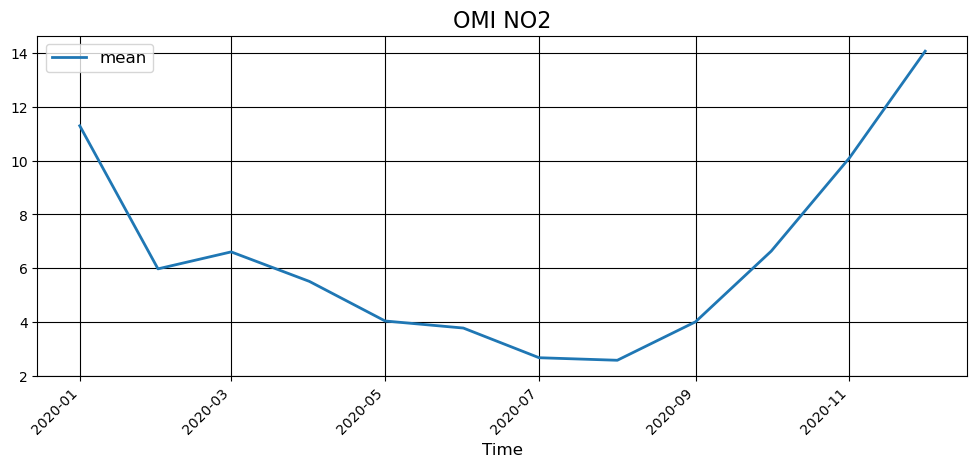

In [436]:
yellow_sea_omi_no2 = firealarm_processing.spatial_timeseries(NEXUS_URL, 'GMU-OMI-0.25deg-monthly-Global-NO2', yellow_sea_bb, yellow_sea_start_time, yellow_sea_end_time)
plotting.timeseries_plot([(yellow_sea_omi_no2['mean'], 'mean')], 'Time', '', 'OMI NO2')

# 2022 Fire Season in Southeast Asia
Fire season typically runs from February to April each year and is characterized by high temperatures, dry weather, and widespread agricultural burning.  

Relevant Articles:
- https://earthobservatory.nasa.gov/images/91771/its-fire-season-in-southeast-asia

### Area of Interest

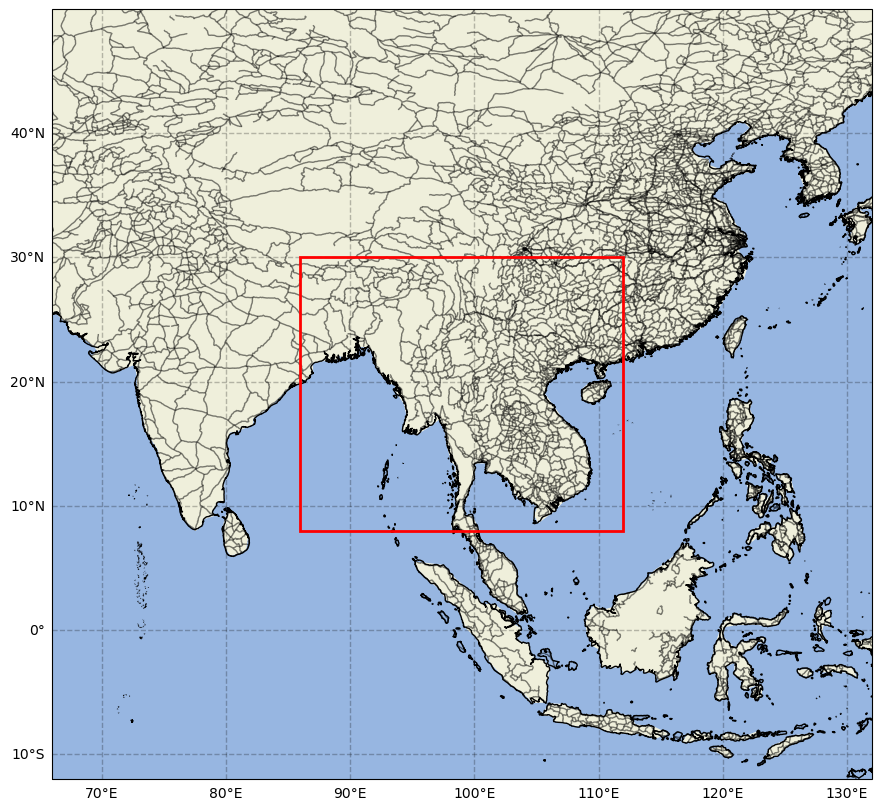

In [847]:
anomalies_start_time = datetime(2022, 2, 1)
anomalies_end_time = datetime(2022, 4, 30)
GMU_NO2_dataset = 'GMU-OMI-0.25deg-monthly-Global-NO2'
GMU_O3_dataset = 'GMU-OMI-0.25deg-monthly-Global-O3'

anomalies_bb = {'min_lon': 86, 'max_lon': 112, 'min_lat': 8, 'max_lat': 30}
plotting.map_box(anomalies_bb)

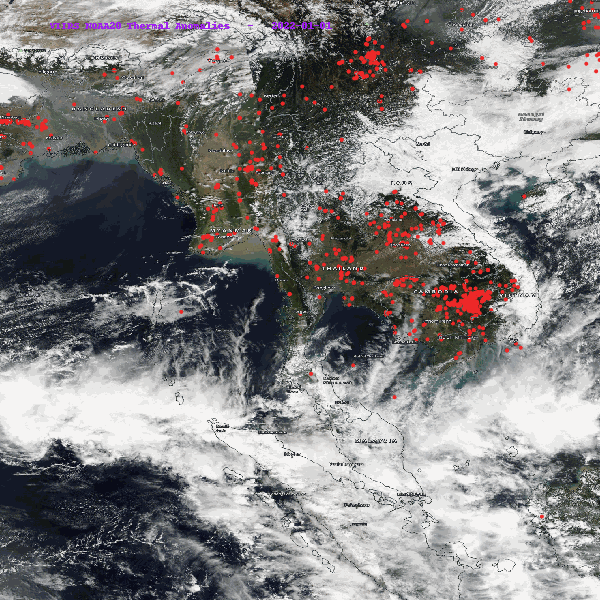

In [278]:
# Note: takes ~20s to generate
wms = WebMapService('https://gibs.earthdata.nasa.gov/wms/epsg4326/best/wms.cgi?', version='1.3.0')

layers=['VIIRS_NOAA20_CorrectedReflectance_TrueColor', 
        'VIIRS_NOAA20_Thermal_Anomalies_375m_All',
        'Reference_Features',
        'Reference_Labels']
color = 'rgb(160, 32, 240)'
frames = []

sdate = datetime(2022, 1, 1)
edate = datetime(2022, 4, 1)
dates = pd.date_range(sdate,edate,freq='MS') 

for day in dates:
    datatime = day.strftime("%Y-%m-%d")
    img = wms.getmap(layers=layers,  # Layers
                     srs='epsg:4326',  # Map projection
                     bbox=(86, -5, 112, 31), # Bounds
                     size=(600,600),  # Image size
                     time=datatime,  # Time of data
                     format='image/png',  # Image format
                     transparent=True)  # Nodata transparency

    image = I.open(img)
    draw = ImageDraw.Draw(image)
    (x, y) = (50, 20)
    draw.text((x, y), f'VIIRS NOAA20 Thermal Anomalies   -   {datatime}', fill=color)
    frames.append(image)
    
frames[0].save('VIIRS_NOAA20_Thermal_Anomalies_375m_All.gif',
               format='GIF',
               append_images=frames,
               save_all=True,
               duration=1000,
               loop=0)

Image('VIIRS_NOAA20_Thermal_Anomalies_375m_All.gif')

### NO2 Levels

#### NO2 Spatial Mean

url
 https://ideas-digitaltwin.jpl.nasa.gov/nexus//timeSeriesSpark?ds=GMU-OMI-0.25deg-monthly-Global-NO2&minLon=86&minLat=8&maxLon=112&maxLat=30&startTime=2022-01-01T00:00:00Z&endTime=2022-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from IDEAS...took 1.6286667690146714 seconds


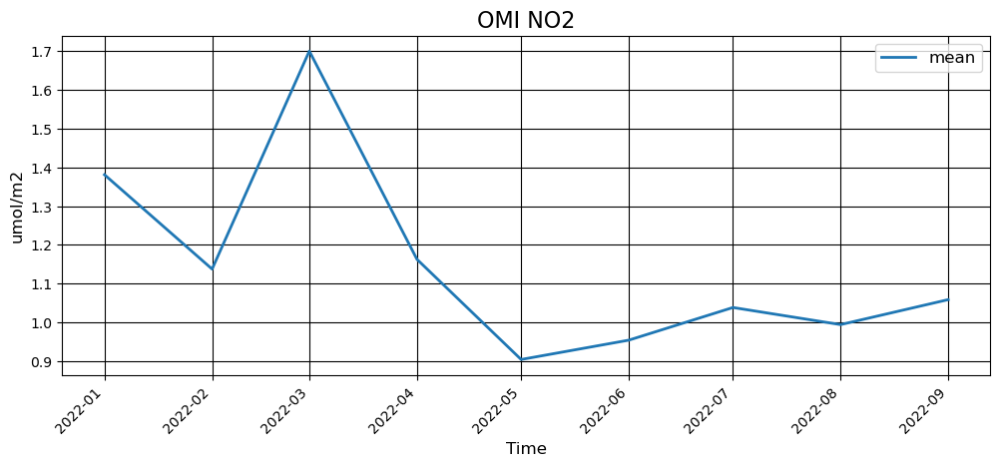

In [279]:
anomalies_NO2 = firealarm_processing.spatial_timeseries(NEXUS_URL, GMU_NO2_dataset, anomalies_bb, datetime(2022, 1, 1), datetime(2022, 9, 1))
plotting.timeseries_plot([(anomalies_NO2['mean'], 'mean')], 'Time', units['NO2'], 'OMI NO2')

#### NO2 Temporal Mean

In [848]:
NO2_temporal_mean_data = firealarm_processing.temporal_mean(NEXUS_URL, GMU_NO2_dataset, anomalies_bb, anomalies_start_time, anomalies_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeAvgMapSpark?ds=GMU-OMI-0.25deg-monthly-Global-NO2&b=86,8,112,30&startTime=2022-02-01T00:00:00Z&endTime=2022-04-30T00:00:00Z

Waiting for response from FireAlarm... took 8.350535708945245 seconds


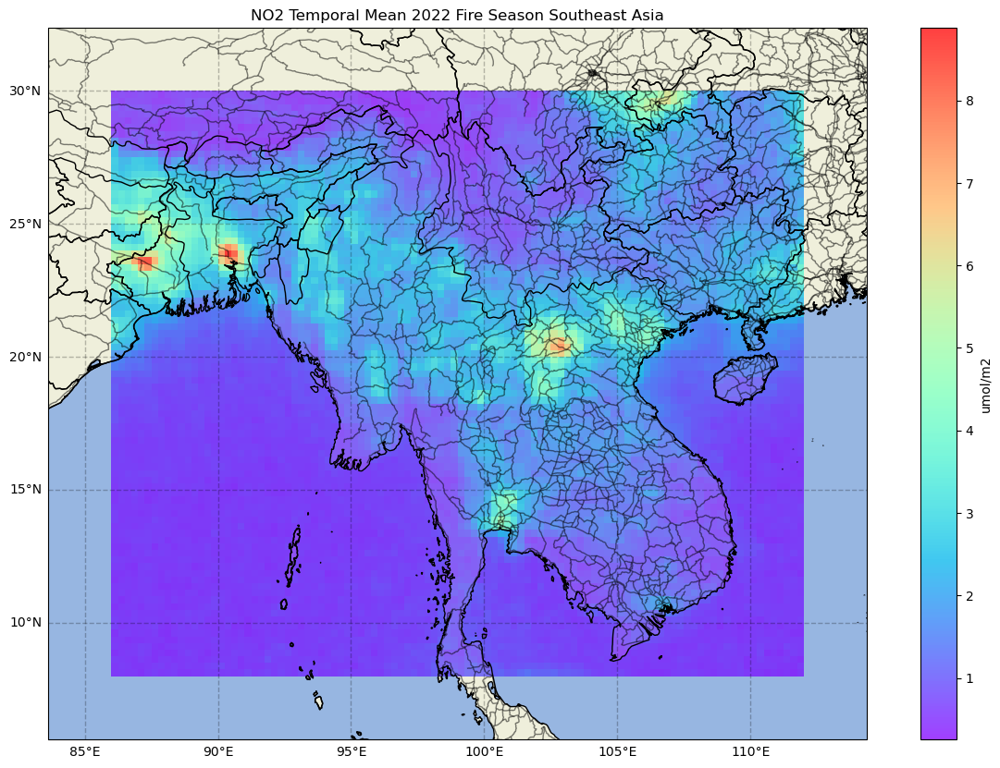

In [855]:
plotting.map_data(NO2_temporal_mean_data, "NO2 Temporal Mean 2022 Fire Season Southeast Asia", cb_label='umol/m2')

### O3 Levels

#### O3 Spatial Mean

In [850]:
anomalies_O3 = firealarm_processing.spatial_timeseries(NEXUS_URL, GMU_O3_dataset, anomalies_bb, datetime(2022, 1, 1), datetime(2022, 9, 1))

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeSeriesSpark?ds=GMU-OMI-0.25deg-monthly-Global-O3&minLon=86&minLat=8&maxLon=112&maxLat=30&startTime=2022-01-01T00:00:00Z&endTime=2022-09-01T00:00:00Z&lowPassFilter=False

Waiting for response from FireAlarm...took 2.0404545000055805 seconds


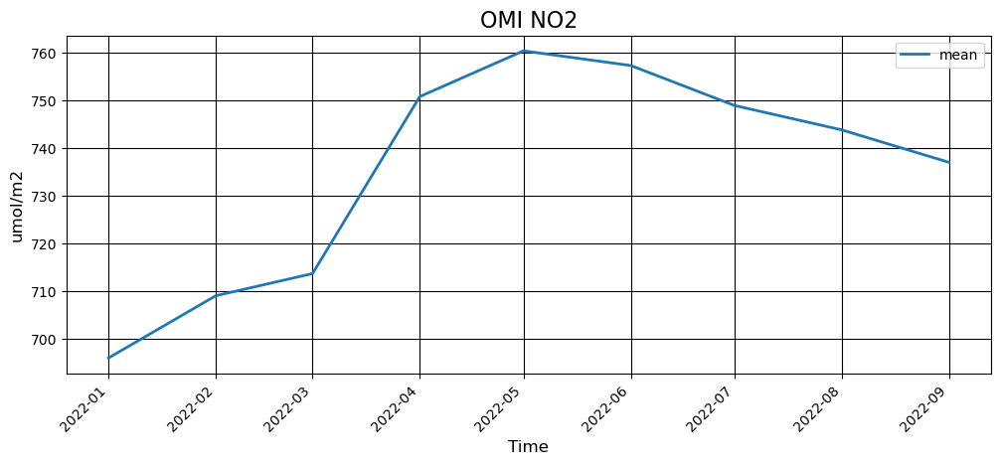

In [851]:
plotting.timeseries_plot([(anomalies_O3['mean'], 'mean')], 'Time', 'umol/m2', 'OMI NO2')

#### O3 Temporal Mean

In [852]:
O3_temporal_mean_data = firealarm_processing.temporal_mean(NEXUS_URL, GMU_O3_dataset, anomalies_bb, anomalies_start_time, anomalies_end_time)

https://ideas-digitaltwin.jpl.nasa.gov/nexus/timeAvgMapSpark?ds=GMU-OMI-0.25deg-monthly-Global-O3&b=86,8,112,30&startTime=2022-02-01T00:00:00Z&endTime=2022-04-30T00:00:00Z

Waiting for response from FireAlarm... took 3.283448249916546 seconds


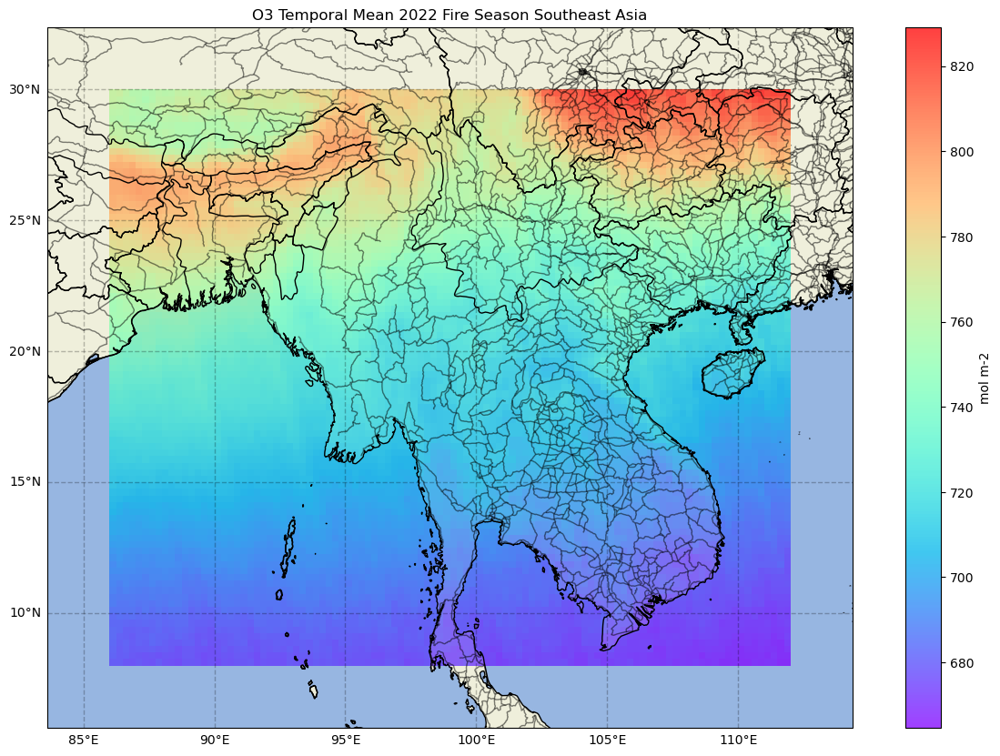

In [854]:
plotting.map_data(O3_temporal_mean_data, "O3 Temporal Mean 2022 Fire Season Southeast Asia", cb_label='mol m-2')